# Import packages

In [159]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
from keras.layers import Lambda, Conv2D, MaxPooling2D, Dropout, Dense, Flatten, BatchNormalization

np.random.seed(0)

In [69]:
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import os
import math
import zipfile
import pickle
import seaborn as sns
%matplotlib inline

In [154]:
from utils import *

# download data

In [341]:
from download_file import *
url = "https://d17h27t6h515a5.cloudfront.net/topher/2016/December/584f6edd_data/data.zip"
download_dir = '..//..//datasets_collection//behavior_cloning_data'
maybe_download_and_extract(url, download_dir)    

- Download progress: 100.0%
Download finished. Extracting files.
Done.


# Unzip data (For EC2)

In [74]:
def unzip_data(file_path, dir_path):
    if not os.path.exists(file_path.split(".")[0]):
        zipfile.ZipFile(file=file_path, mode="r").extractall(dir_path)
    else:
        print ("Data has already been downloaded and unpacked.")

In [76]:
unzip_data("data//recovery.zip", "data")
unzip_data("data//normal.zip", "data")

Data has already been downloaded and unpacked.


# Read data

In [155]:
def load_data(data_dir):
    """
    Load training data and split it into training and validation set
    """
    data_df = pd.read_csv(os.path.join(data_dir, 'driving_log.csv'))

    X = data_df[['center', 'left', 'right']].values
    y = data_df['steering'].values
    return X, y

In [86]:
print('load_data')
normal_data_path = "..\\..\\datasets_collection\\behavior_cloning_data\\normal"  
recovery_data_path = "..\\..\\datasets_collection\\behavior_cloning_data\\recovery"
features_normal, labels_normal = load_data(data_dir = normal_data_path)
features_recovery, labels_recovery = load_data(data_dir = recovery_data_path)

load_data


In [138]:
def moving_average(array):
    window_size = 7
    stride = window_size//2
    MA_array=[]
    padded_array = np.append([0]*stride, array)
    padded_array = np.append(padded_array, [0]*stride)
    m = len(padded_array)

    for i in range(stride, m-stride):
        if padded_array[i] == 0:
            if padded_array[i-1] !=0 or padded_array[i+1] !=0:  # average
                MA_array.append((padded_array[i-1] + padded_array[i+1])/2)
            else: # sliding window
                MA_array.append(sum(padded_array[i-stride:i+stride+1])/(2*stride))
        else:
            MA_array.append(padded_array[i])
#         yield sum(padded_array[i-stride:i+stride+1])/(2*stride)
    return np.array(MA_array)

In [139]:
smooth_labels_normal = moving_average(labels_normal)
smooth_labels_recovery = moving_average(labels_recovery)

D:\Anaconda_36\envs\car-behavioral-cloning\lib\site-packages\seaborn\timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


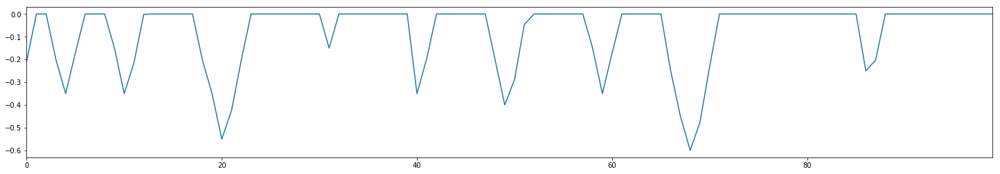

In [141]:
a4_dims = (25, 4)
fig, ax = plt.subplots(figsize=a4_dims)
sns.tsplot(data=labels_normal[1400:1500], ax=ax)

D:\Anaconda_36\envs\car-behavioral-cloning\lib\site-packages\seaborn\timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


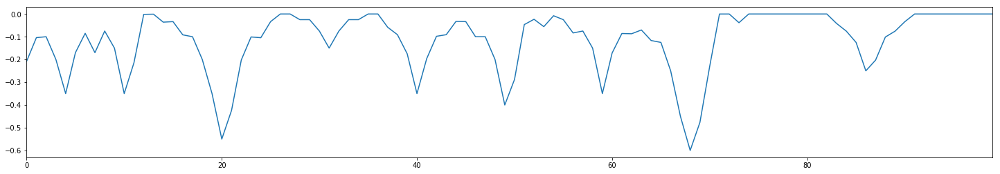

In [142]:
a4_dims = (25, 4)
fig, ax = plt.subplots(figsize=a4_dims)
sns.tsplot(data=smooth_labels_normal[1400:1500], ax=ax)

In [147]:
data = train_test_split(np.vstack((features_normal,features_recovery))
                                                      , np.hstack((smooth_labels_normal, smooth_labels_recovery))
                                                      , test_size=0.2
                                                      , random_state=0)
X_train, X_valid, y_train, y_valid = data
print ("training set of x:", X_train.shape)
print ("training set of y:", y_train.shape)
print ("valid set of x:", X_valid.shape)
print ("valid set of y:", y_valid.shape)

training set of x: (3843, 3)
training set of y: (3843,)
valid set of x: (961, 3)
valid set of y: (961,)


Text(0.5,1,'smoothed labels for recovery set')

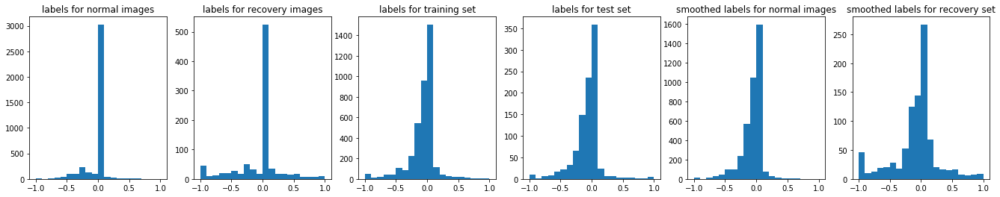

In [148]:
import seaborn as sns
a4_dims = (23, 4)
fig, ax = plt.subplots(1, 6, figsize=a4_dims)
n_bins = 20
ax[0].hist(labels_normal, bins=n_bins)
ax[0].set_title("labels for normal images")
ax[1].hist(labels_recovery, bins=n_bins)
ax[1].set_title("labels for recovery images")
ax[2].hist(y_train, bins=n_bins)
ax[2].set_title("labels for training set")
ax[3].hist(y_valid, bins=n_bins)
ax[3].set_title("labels for test set")

ax[4].hist(smooth_labels_normal, bins=n_bins)
ax[4].set_title("smoothed labels for normal images")
ax[5].hist(smooth_labels_recovery, bins=n_bins)
ax[5].set_title("smoothed labels for recovery set")

In [157]:
def all_data_generator(X_train, y_train):
    aug_images = []
    aug_labels = []
    m = len(X_train)
    MA_WINDOW = 3  # moving average window
    ANGLE_OFFSET = 0.15  # angle offset for left/right cameras

    for i in range(m):
        # original image: features[0]- center, features[1]- left, features[2]- right
        img = mpimg.imread(X_train[i][0])
        aug_images.append(img) 
        aug_labels.append(y_train[i])

    #     # left
    #     aug_labels.append(min(1., labels[i] + ANGLE_OFFSET))
    #     aug_images.append(mpimg.imread(features[i][1])) 

    #     # right
    #     aug_labels.append(max(-1., labels[i] - ANGLE_OFFSET))
    #     aug_images.append(mpimg.imread(features[i][2])) 

        # flippling
        fliped_img, steering_angle = random_flip(img, y_train[i])
        aug_images.append(fliped_img) 
        aug_labels.append(steering_angle)
        
    pickle_images = np.array(aug_images)
    pickle_labels = np.array(aug_labels)

    driving_data = {}
    driving_data['images'] = pickle_images
    driving_data['labels'] = pickle_labels

    pickle_data_path = "..\\..\\datasets_collection\\behavior_cloning_data\\augment_imgs_pickle\\aug_data.p"

    with open(pickle_data_path, mode='wb') as f:
        pickle.dump(driving_data, f)

# Utility

In [152]:
def convert_color(img, conv='YCrCb'):
    if conv == 'YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if conv == 'LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if conv == 'LAB':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    if conv == 'YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

In [153]:
def display_imgs_uint8(imgs, img_num_per_row, img_size, fig_size, title):
    """
    A function to show imageS
    
    parameter:
    
    -- imgs: list
           List of images
    -- img_num_per_row: int
           THE number of images per row
    -- img_size: tuple of two ints
           Image size 
    -- fig_size: tuple of two ints
           Figure size
    """

    col_num = math.ceil(len(imgs)/img_num_per_row)
    RGB_img = np.zeros((img_size[0] * col_num, img_size[1] * img_num_per_row, 3), dtype=np.uint8)

    for i, img in enumerate(imgs):            
        RGB_img[img_size[0] * (i//img_num_per_row):img_size[0] * ((i//img_num_per_row) + 1)
                ,img_size[1] * (i%img_num_per_row):img_size[1] * ((i%img_num_per_row) + 1),:] = img

    fig, ax = plt.subplots(figsize=fig_size)
    ax.set_title(title)
    ax.imshow(RGB_img, aspect='auto')
    plt.tight_layout()
    return RGB_img

# Modelling

## Preprocessing

In [158]:
# def rgb2combinedColor(image):
#     """
#     Convert the image from RGB to YUV (This is what the NVIDIA model does)
#     """
#     YCrCb_views = convert_color(image, 'YCrCb')
#     HSV_views = convert_color(image, 'HSV')
#     LUV_views = convert_color(image, 'LUV')
#     HLS_views = convert_color(image, 'HLS')
#     LAB_views = convert_color(image, 'LAB')
#     YUV_views = convert_color(image, 'YUV')
#     return np.dstack((convert_color(image, 'LAB')[:,:,0], convert_color(image, 'HLS')[:,:,2], convert_color(image, 'YUV')[:,:,0]))

def preprocess(image):
    """
    Combine all preprocess functions into one
    
    input size: (160, 320, 3)
    After crop: (75, 320, 3)
    After reszie: (45, 192, 3)
    """ 
    image = crop(image)
    image = resize(image)
    image = convert_color(image, 'YUV')

    return image

## Data augmentation

In [113]:
def augument(data_dir, center, left, right, steering_angle):
    """
    Generate an augumented image and adjust steering angle.
    (The steering angle is associated with the center image)
    """
    image = load_image(data_dir, center)
    image, steering_angle = random_flip(image, steering_angle)
#     image = random_shadow(image)
#     image = random_brightness(image)
    return image, steering_angle

In [120]:
def batch_generator(data_dir, image_paths, steering_angles, batch_size, is_training):
    """
    Generate training image give image paths and associated steering angles
    """
    images = np.empty([batch_size, IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS])
    steers = np.empty(batch_size)
    while True:
        i = 0
        for index in np.random.permutation(image_paths.shape[0]):
            center, left, right = image_paths[index]
            steering_angle = steering_angles[index]
            # with augmentation
            if is_training: 
                image, steering_angle = augument(data_dir, center, left, right, steering_angle)
                
            # without augmentation
            else:
                image = load_image(data_dir, center)
            # add the image and steering angle to the batch
            images[i] = preprocess(image)
            steers[i] = steering_angle
            i += 1
            if i == batch_size:
                break
        yield images, steers

In [115]:
def build_model():
    """
    Modified NVIDIA model
    Ref: https://devblogs.nvidia.com/deep-learning-self-driving-cars/
    """
    model = Sequential()
    model.add(Lambda(lambda x: x/255-0.5, input_shape=INPUT_SHAPE))
    model.add(Conv2D(24, 5, 5, activation='elu', subsample=(2, 2)))
    model.add(Dropout(0.2))
#     model.add(BatchNormalization())
    
    model.add(Conv2D(36, 5, 5, activation='elu', subsample=(2, 2))) # kernel_regularizer=regularizers.l2(weight_decay)
    model.add(Dropout(0.2))
#     model.add(BatchNormalization())
    
    model.add(Conv2D(48, 5, 5, activation='elu', subsample=(2, 2)))
    model.add(Dropout(0.2))
#     model.add(BatchNormalization())
    
    model.add(Conv2D(64, 3, 3, activation='elu'))
    model.add(Dropout(0.2))
#     model.add(BatchNormalization())
    
#     model.add(Conv2D(64, 3, 3, activation='elu'))
#     model.add(Dropout(0.2))
#     model.add(BatchNormalization())
   
    
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())
    
    model.add(Dense(50, activation='elu'))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())
    
    model.add(Dense(10, activation='elu'))
#     model.add(Dropout(0.2))
#     model.add(BatchNormalization())
    
    model.add(Dense(1))
    
    return model

In [116]:
print('build_model')
model = build_model()

build_model


In [63]:
# model.summary()

In [123]:
def train_model(model, parameter, X_train, X_valid, y_train, y_valid):
    """
    Train the model
    """
    checkpoint = ModelCheckpoint('model-{epoch:03d}.h5',
                                 monitor='val_loss',
                                 verbose=0,
                                 save_best_only=parameter["save_best_only"],
                                 mode='auto')

    model.compile(loss='mean_squared_error', optimizer=Adam(lr=parameter["learning_rate"]))

    model.fit_generator(batch_generator(parameter["data_dir"], X_train, y_train, parameter["batch_size"], True),
                        parameter["samples_per_epoch"],
                        parameter["nb_epoch"],
                        max_q_size=1,
                        validation_data=batch_generator(parameter["data_dir"], X_valid, y_valid, parameter["batch_size"], False),
                        nb_val_samples=len(X_valid),
                        callbacks=[checkpoint],
                        verbose=1)
    return model

In [124]:
data_dir = '..//..//datasets_collection//behavior_cloning_data'

In [126]:
parameters = {
            "data_dir": data_dir
            , "nb_epoch" : 10
            , "samples_per_epoch" : 19200 # 64*300
            , "batch_size" : 64
            , "save_best_only" : False
            , "learning_rate" : 1.0e-4} 

In [125]:
final_model = train_model(model, parameters, *data)
print('end')

Epoch 1/5
19200/19200 [==============================] - 298s - loss: 0.2436 - val_loss: 0.0446
Epoch 2/5
19200/19200 [==============================] - 287s - loss: 0.1251 - val_loss: 0.0529
Epoch 3/5
19200/19200 [==============================] - 288s - loss: 0.0965 - val_loss: 0.0413
Epoch 4/5
19200/19200 [==============================] - 286s - loss: 0.0744 - val_loss: 0.0437
Epoch 5/5
19200/19200 [==============================] - 293s - loss: 0.0658 - val_loss: 0.0390
end


In [127]:
final_model = train_model(final_model, parameters, *data)

Epoch 1/10
19200/19200 [==============================] - 237s - loss: 0.0573 - val_loss: 0.0404
Epoch 2/10
19200/19200 [==============================] - 236s - loss: 0.0516 - val_loss: 0.0406
Epoch 3/10
19200/19200 [==============================] - 241s - loss: 0.0475 - val_loss: 0.0436
Epoch 4/10
19200/19200 [==============================] - 242s - loss: 0.0464 - val_loss: 0.0358
Epoch 5/10
19200/19200 [==============================] - 244s - loss: 0.0457 - val_loss: 0.0402
Epoch 6/10
19200/19200 [==============================] - 246s - loss: 0.0426 - val_loss: 0.0419
Epoch 7/10
19200/19200 [==============================] - 246s - loss: 0.0415 - val_loss: 0.0384
Epoch 8/10
19200/19200 [==============================] - 246s - loss: 0.0407 - val_loss: 0.0379
Epoch 9/10
19200/19200 [==============================] - 245s - loss: 0.0416 - val_loss: 0.0358
Epoch 10/10
19200/19200 [==============================] - 254s - loss: 0.0402 - val_loss: 0.0390


### model saving

In [53]:
final_model.save_weights('final_model.h5')

### model loading

In [ ]:
from keras.models import load_model
# load_weights only sets the weights of your network. You still need to define its architecture before calling load_weights
model2 = create_model()
model2.load_weights('model//EC2_model//keras_german_sign_ADAM_weighted_93_2.h5')

### model architechture

In [63]:
model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_7 (Lambda)                (None, 66, 200, 3)    0           lambda_input_7[0][0]             
____________________________________________________________________________________________________
convolution2d_14 (Convolution2D) (None, 31, 98, 24)    1824        lambda_7[0][0]                   
____________________________________________________________________________________________________
dropout_13 (Dropout)             (None, 31, 98, 24)    0           convolution2d_14[0][0]           
____________________________________________________________________________________________________
batchnormalization_11 (BatchNorm (None, 31, 98, 24)    96          dropout_13[0][0]                 
___________________________________________________________________________________________

# Organize Data 

## Delete uncorrect data

In [9]:
def DeleteImages(images):
    for i in images:
        os.remove(i) 

In [8]:
delete_path = '..//..//datasets_collection//behavior_cloning_data'
target_path = 'data_driving//IMG//*2016_12*'

In [60]:
os.path.join(delete_path, target_path)

'..//..//datasets_collection//behavior_cloning_data\\data_driving//IMG//*2016_12*'

In [61]:
images = glob.glob(os.path.join(delete_path, target_path))

In [ ]:
DeleteImages(images)

## Delete data during specific time

In [26]:
delete_path = '..//..//datasets_collection//behavior_cloning_data'
Current_track = 'data_driving'
csv_path = os.path.join(delete_path,Current_track, 'driving_log.csv')
data_df = pd.read_csv(csv_path)
print ("before delete rows:",len(data_df))
start_time = "16_45_19_156"
end_time = "16_45_42_550"
start_index = data_df.index[data_df["center"].str.contains(start_time) == True][0]
end_index = data_df.index[data_df["center"].str.contains(end_time) == True][0]
# delete images
wrong_imgs = data_df.iloc[start_index:end_index].center.str.slice(-16,-4).tolist()
for i in wrong_imgs:
    images = glob.glob(os.path.join(delete_path, Current_track, 'IMG//*{}*'.format(i)))
    DeleteImages(images)

# delete rows in csv file
pd.concat([data_df[:start_index], data_df[end_index:]], axis=0).to_csv(csv_path, index=False)

before delete rows: 938


## Merge multiple data source

In [103]:
import shutil
merge_path = '..//..//datasets_collection//behavior_cloning_data'

### merge rows in csv file

In [104]:
src_track = 'data_driving_02'
dst_track = 'data_driving'

In [286]:
master_csv_path = os.path.join(merge_path, dst_track, 'driving_log.csv')
slave_csv_path = os.path.join(merge_path, src_track, 'driving_log.csv')

master_data_df = pd.read_csv(master_csv_path)
slave_data_df = pd.read_csv(slave_csv_path)

print ("before delete rows:",len(master_data_df))


pd.concat([master_data_df, slave_data_df], axis=0).to_csv(master_csv_path, index=False)

before delete rows: 6623


### MOVE IMAGES

In [287]:
src_dir = os.path.join(merge_path, src_track, 'IMG//*.jpg')
images = glob.glob(src_dir)
dst_dir = os.path.join(merge_path, dst_track, 'IMG')
for i in images:
    shutil.move(i, dst_dir)

### rename the directory

In [79]:
merge_path = '..//..//datasets_collection//behavior_cloning_data'

In [80]:
# normal recovery

In [83]:
directory_csv_path = os.path.join(merge_path, 'recovery', 'driving_log.csv')
data_df = pd.read_csv(directory_csv_path)
data_df["center"] = data_df["center"].str.replace(r"D:\GitHub\Datasets_collection\behavior_cloning_data", '')
data_df["left"] = data_df["left"].str.replace(r"D:\GitHub\Datasets_collection\behavior_cloning_data", '')
data_df["right"] = data_df["right"].str.replace(r"D:\GitHub\Datasets_collection\behavior_cloning_data", '')
data_df.to_csv(directory_csv_path, index=False)

### remove the header in driving_log.csv

In [111]:
directory_csv_path = os.path.join(merge_path, 'normal', 'driving_log.csv')
data_df = pd.read_csv(directory_csv_path)
data_df["center"] = data_df["center"].str.split("behavior_cloning_data\\\\").str[1]
data_df["left"] = data_df["left"].str.split("behavior_cloning_data\\\\").str[1]
data_df["right"] = data_df["right"].str.split("behavior_cloning_data\\\\").str[1]
data_df.to_csv(directory_csv_path, index=False)

### sanity check

In [225]:
#### image

In [113]:
sanity_check_img_path = os.path.join(merge_path, dst_track, 'IMG', 'center_2018*.jpg')
images = glob.glob(sanity_check_img_path)

In [114]:
len(images)

11280

In [115]:
np.sort(pd.Series(images).str.slice(-16, -11).unique())

array(['03_48', '03_49', '05_48', '05_49', '05_50', '05_51', '05_59',
       '06_00', '06_01', '06_13', '06_14', '06_16', '06_17', '06_18',
       '06_19', '06_22', '06_23', '06_24', '06_27', '16_32', '16_33',
       '16_34', '16_35', '16_36', '16_45', '16_46', '16_47', '16_48',
       '20_27', '20_28', '20_29', '20_30', '20_36', '20_37', '20_38',
       '20_39', '21_23', '21_24', '21_25'], dtype=object)

In [226]:
#### csv

In [111]:
sanity_check_csv_path = os.path.join(merge_path, dst_track, 'driving_log.csv')
sanity_check_df = pd.read_csv(sanity_check_csv_path)
len(sanity_check_df)

2641

In [112]:
np.sort(sanity_check_df["center"].str.slice(-16, -11).unique())  # hour minuete

array(['13_47', '13_48', '14_37', '14_38', '14_39', '14_41', '14_42',
       '14_44', '16_56', '16_57'], dtype=object)

### check if there is null value

In [324]:
sanity_check_df.isnull().sum().sum()

0

### index with null value

In [315]:
pd.isnull(sanity_check_df).any(1).nonzero()[0]

array([6301, 6302, 6303, 6304, 6305, 6306, 6307, 6308, 6309, 6310, 6311,
       6312, 6313, 6314, 6315, 6316, 6317, 6318, 6319, 6320, 6321, 6322,
       6323, 6324, 6325, 6326, 6327, 6328, 6329, 6330, 6331, 6332, 6333,
       6334, 6335, 6336, 6337, 6338, 6339, 6340, 6341, 6342, 6343, 6344,
       6345, 6346, 6347, 6348, 6349, 6350, 6351, 6352, 6353, 6354, 6355,
       6356, 6357, 6358, 6359, 6360, 6361, 6362, 6363, 6364, 6365, 6366,
       6367, 6368, 6369, 6370, 6371, 6372, 6373, 6374, 6375, 6376, 6377,
       6378, 6379, 6380, 6381, 6382, 6383, 6384, 6385, 6386, 6387, 6388,
       6389, 6390, 6391, 6392, 6393, 6394, 6395, 6396, 6397, 6398, 6399,
       6400, 6401, 6402, 6403, 6404, 6405, 6406, 6407, 6408, 6409, 6410,
       6411, 6412, 6413, 6414, 6415, 6416, 6417, 6418, 6419, 6420, 6421,
       6422, 6423, 6424, 6425, 6426, 6427, 6428, 6429, 6430, 6431, 6432,
       6433, 6434, 6435, 6436, 6437, 6438, 6439, 6440, 6441, 6442, 6443,
       6444, 6445, 6446, 6447, 6448, 6449, 6450, 64

# Test

In [76]:
images = glob.glob('..//..//Datasets_collection//behavior_cloning_data//data//IMG//*')
print ("total image number: " + str(len(images)))

total image number: 24108


In [77]:
views = [] 
for i in np.random.choice(len(images), 10):
    views.append(mpimg.imread(images[i]))

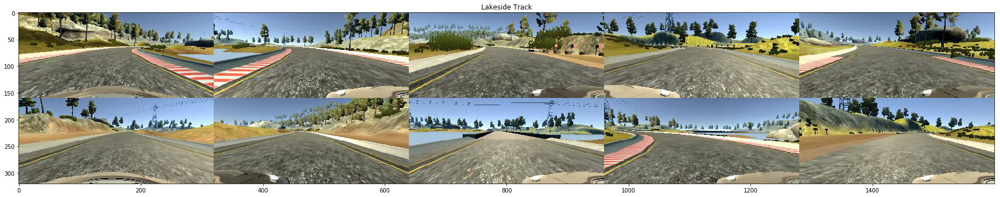

In [78]:
RGB_img = display_imgs_uint8(views, 5, (160,320), (25,5), "Lakeside Track")

# Preprocessing

## Cropping unused region

In [63]:
Crop_imgs = []
for i in views:
    Crop_imgs.append(i[60:-25, :, :])

In [64]:
Crop_imgs[0].shape

(75, 320, 3)

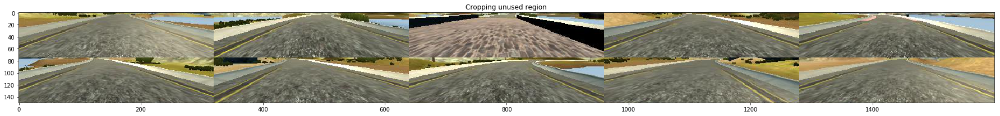

In [65]:
Cropped_imgs = display_imgs_uint8(Crop_imgs, 5, (75,320), (25,3), "Cropping unused region")

## Resizing

In [83]:
Resize_img = []
for i in Crop_imgs:
    Resize_img.append(cv2.resize(i, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA))

In [84]:
Resize_img[0].shape

(25, 105, 3)

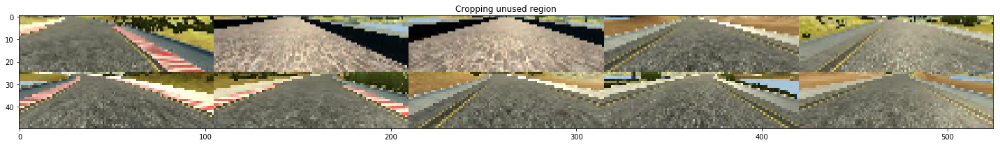

In [85]:
Resized_img = display_imgs_uint8(Resize_img, 5, (IMAGE_HEIGHT,IMAGE_WIDTH), (20,3), "Cropping unused region")

# Data Augmentation

## horizontal flip

In [ ]:
def random_flip(image, steering_angle):
    """
    Randomly flipt the image left <-> right, and adjust the steering angle.
    """
    if np.random.rand() < 0.5:
        image = cv2.flip(image, 1)
        steering_angle = -steering_angle
    return image, steering_angle

## horizontal translation

In [91]:
def random_translate(image, steering_angle, range_x, range_y):
    """
    Randomly shift the image virtially and horizontally (translation).
    """
    trans_x = range_x * (np.random.rand() - 0.5)
    trans_y = range_y * (np.random.rand() - 0.5)
    steering_angle += trans_x * 0.002
    trans_m = np.float32([[1, 0, trans_x], [0, 1, trans_y]])
    height, width = image.shape[:2]
    image = cv2.warpAffine(image, trans_m, (width, height))
    return image, steering_angle

## shadow

In [129]:
def random_shadow(image):
    """
    Generates and adds random shadow
    """
    # (x1, y1) and (x2, y2) forms a line
    # xm, ym gives all the locations of the image
    x1, y1 = IMAGE_WIDTH * np.random.rand(), 0
    x2, y2 = IMAGE_WIDTH * np.random.rand(), IMAGE_HEIGHT
    xm, ym = np.mgrid[0:IMAGE_HEIGHT, 0:IMAGE_WIDTH]

    # mathematically speaking, we want to set 1 below the line and zero otherwise
    # Our coordinate is up side down.  So, the above the line: 
    # (ym-y1)/(xm-x1) > (y2-y1)/(x2-x1)
    # as x2 == x1 causes zero-division problem, we'll write it in the below form:
    # (ym-y1)*(x2-x1) - (y2-y1)*(xm-x1) > 0
    mask = np.zeros_like(image[:, :, 1])
    mask[(ym - y1) * (x2 - x1) - (y2 - y1) * (xm - x1) > 0] = 1

    # choose which side should have shadow and adjust saturation
    cond = mask == np.random.randint(2)
    s_ratio = np.random.uniform(low=0.2, high=0.5)

    # adjust Saturation in HLS(Hue, Light, Saturation)
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hls[:, :, 1][cond] = hls[:, :, 1][cond] * s_ratio
    return cv2.cvtColor(hls, cv2.COLOR_HLS2RGB)

In [130]:
ShadowNoise_img = []
for i in Resize_img:
    ShadowNoise_img.append(random_shadow(i))

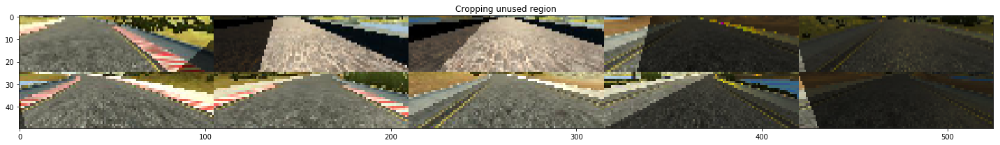

In [131]:
Shadowed_img = display_imgs_uint8(ShadowNoise_img, 5, (IMAGE_HEIGHT,IMAGE_WIDTH), (20,3), "Cropping unused region")

## brightness

In [164]:
def random_brightness(image):
    """
    Randomly adjust brightness of the image.
    """
    # HSV (Hue, Saturation, Value) is also called HSB ('B' for Brightness).
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    ratio = 1.0 + 0.4 * (np.random.rand() - 0.5)
    hsv[:,:,2] =  hsv[:,:,2] * ratio
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

In [165]:
BrightNoise_img = []
for i in Resize_img:
    BrightNoise_img.append(random_brightness(i))

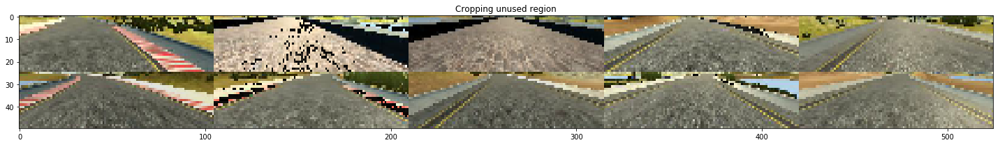

In [166]:
BrightNESSNoise_img = display_imgs_uint8(BrightNoise_img, 5, (IMAGE_HEIGHT,IMAGE_WIDTH), (20,3), "Cropping unused region")

# Color space

In [97]:
YCrCb_views = convert_color(Resized_img, 'YCrCb')
HSV_views = convert_color(Resized_img, 'HSV')
LUV_views = convert_color(Resized_img, 'LUV')
HLS_views = convert_color(Resized_img, 'HLS')
LAB_views = convert_color(Resized_img, 'LAB')
YUV_views = convert_color(Resized_img, 'YUV')

NameError: name 'convert_color' is not defined

## RGB

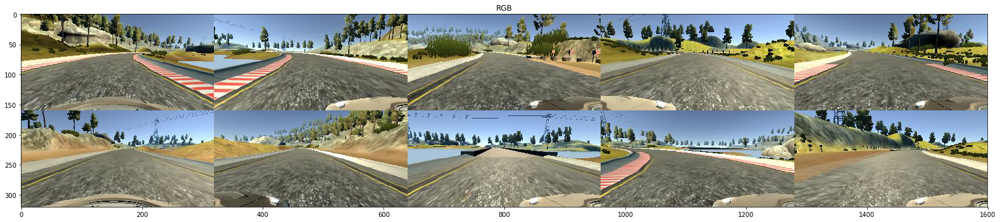

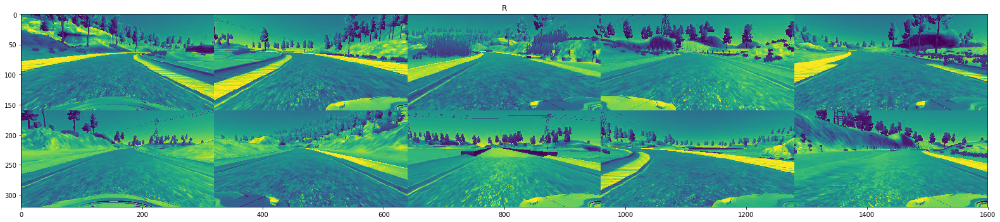

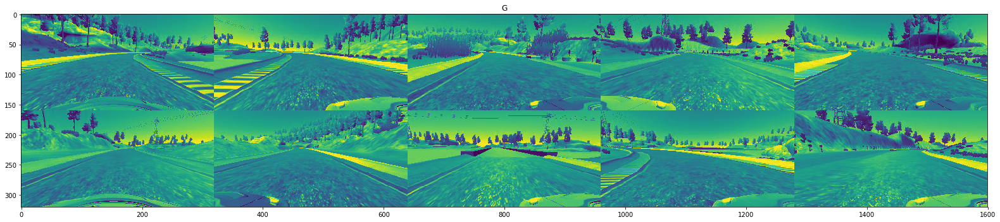

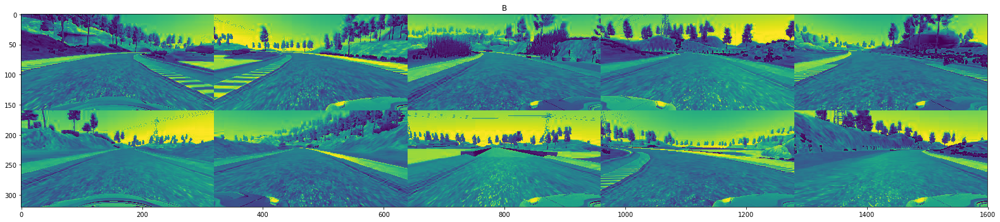

In [79]:
fig, ax = plt.subplots(figsize=(25,5))
ax.set_title("RGB")
ax.imshow(RGB_img)
plt.tight_layout()

fig, ax = plt.subplots(figsize=(25,5))
ax.set_title("R")
ax.imshow(RGB_img[:,:,0])
plt.tight_layout()

fig, ax = plt.subplots(figsize=(25,5))
ax.set_title("G")
ax.imshow(RGB_img[:,:,1])
plt.tight_layout()

fig, ax = plt.subplots(figsize=(25,5))
ax.set_title("B")
ax.imshow(RGB_img[:,:,2])
plt.tight_layout()

## YCrCb

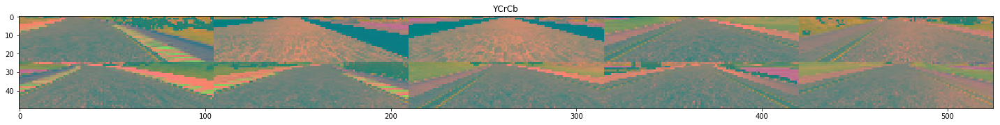

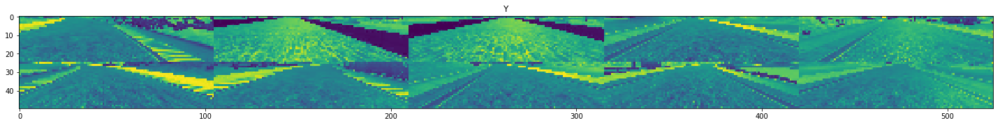

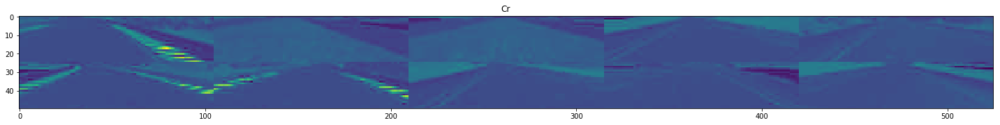

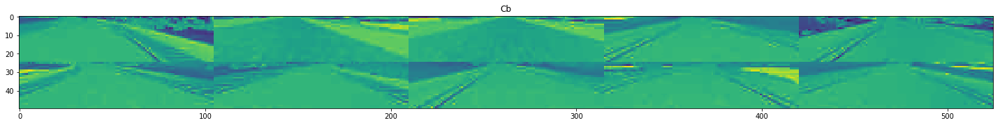

In [88]:
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("YCrCb")
ax.imshow(YCrCb_views)
plt.tight_layout()

fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("Y")
ax.imshow(YCrCb_views[:,:,0])
plt.tight_layout()

fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("Cr")
ax.imshow(YCrCb_views[:,:,1])
plt.tight_layout()

fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("Cb")
ax.imshow(YCrCb_views[:,:,2])
plt.tight_layout()

## HSV

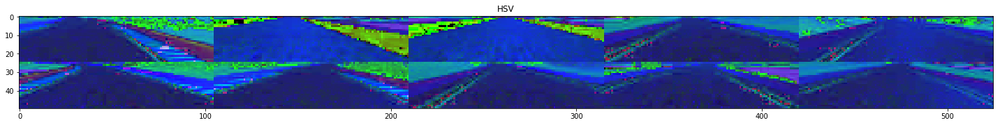

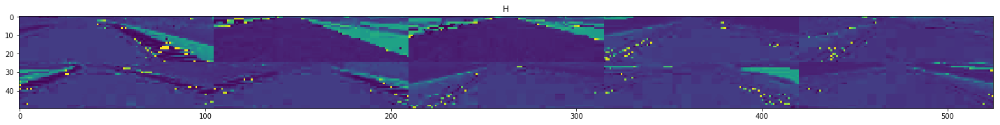

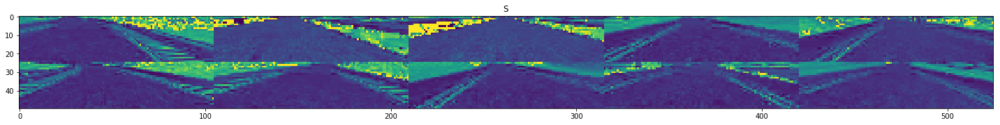

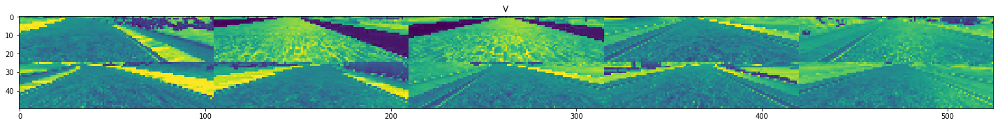

In [89]:
## HSV
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("HSV")
ax.imshow(HSV_views)
plt.tight_layout()
### H
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("H")
ax.imshow(HSV_views[:,:,0])
plt.tight_layout()
### S
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("S")
ax.imshow(HSV_views[:,:,1])
plt.tight_layout()
### V
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("V")
ax.imshow(HSV_views[:,:,2])
plt.tight_layout()

## LUV

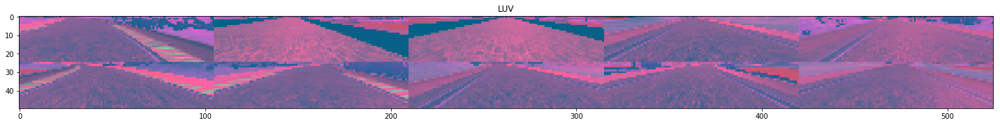

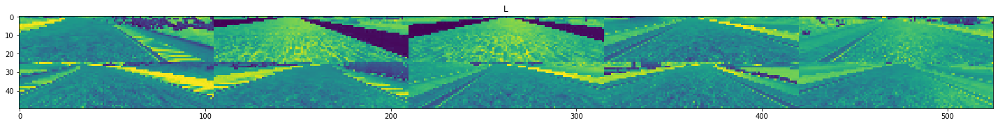

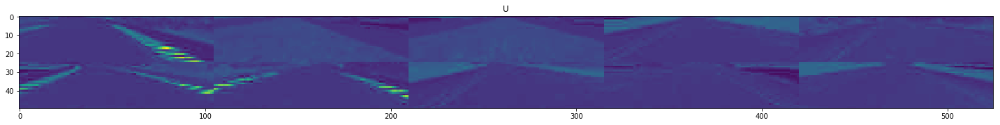

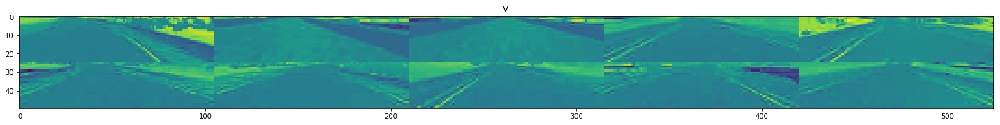

In [90]:
## LUV
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("LUV")
ax.imshow(LUV_views)
plt.tight_layout()
### L
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("L")
ax.imshow(LUV_views[:,:,0])
plt.tight_layout()
### U
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("U")
ax.imshow(LUV_views[:,:,1])
plt.tight_layout()
### V
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("V")
ax.imshow(LUV_views[:,:,2])
plt.tight_layout()

## HLS

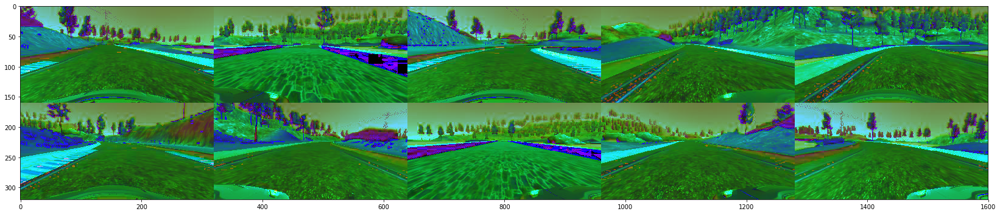

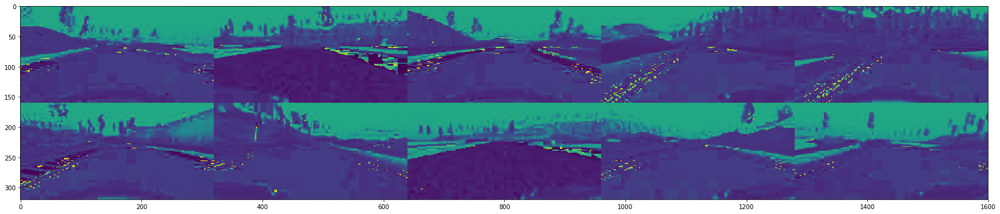

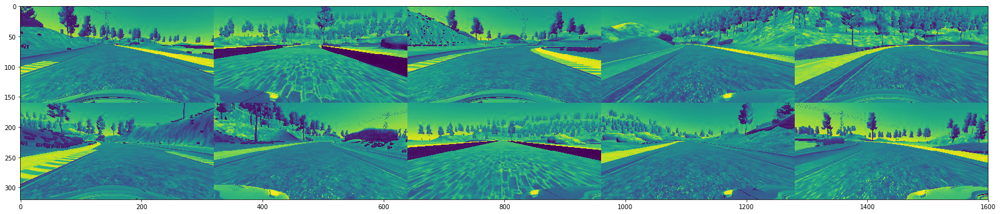

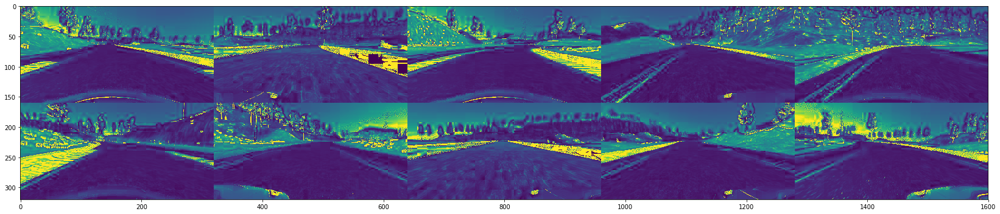

In [47]:
## HLS
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("V")
ax.imshow(HLS_views)
plt.tight_layout()
### H
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("V")
ax.imshow(HLS_views[:,:,0])
plt.tight_layout()
### L
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("V")
ax.imshow(HLS_views[:,:,1])
plt.tight_layout()
### S
fig, ax = plt.subplots(figsize=(20,3))
ax.set_title("V")
ax.imshow(HLS_views[:,:,2])
plt.tight_layout()

## LAB

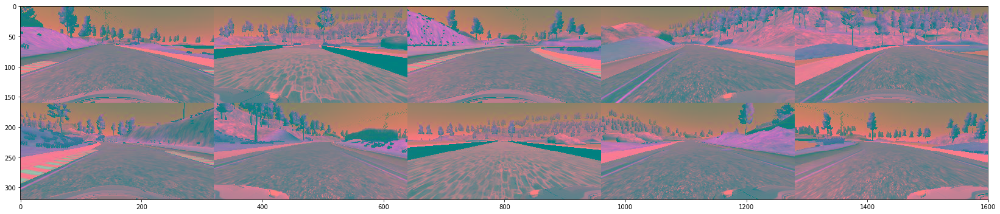

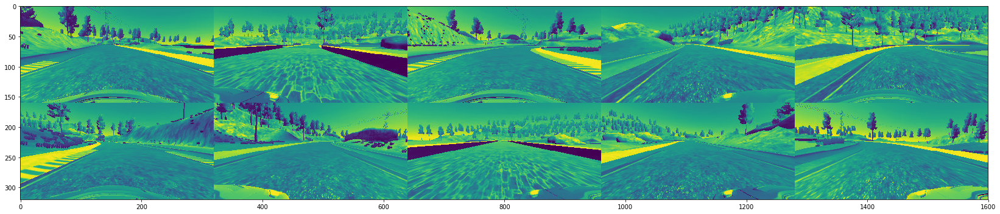

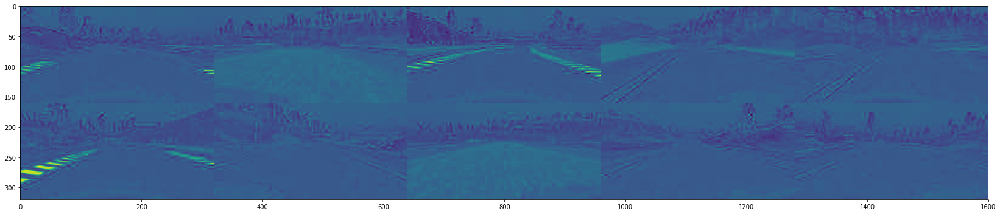

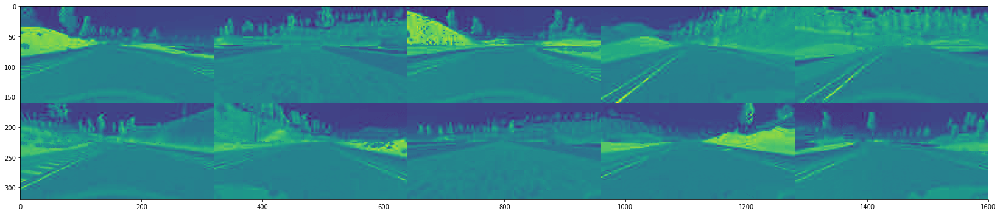

In [48]:
## LAB
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(LAB_views)
plt.tight_layout()
### L
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(LAB_views[:,:,0])
plt.tight_layout()
### A
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(LAB_views[:,:,1])
plt.tight_layout()
### B
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(LAB_views[:,:,2])
plt.tight_layout()

## YUV

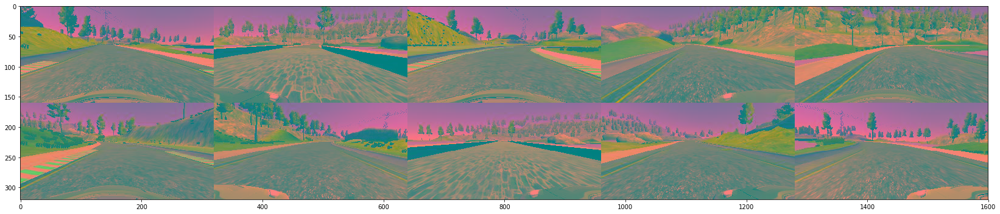

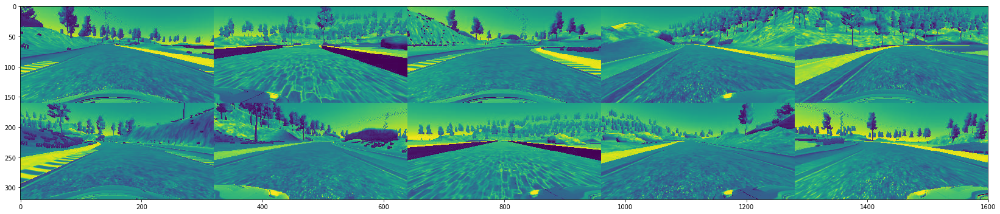

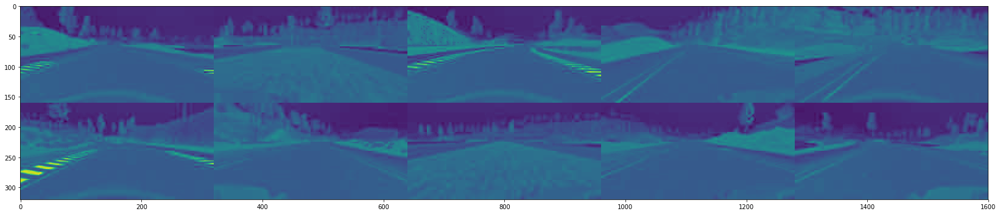

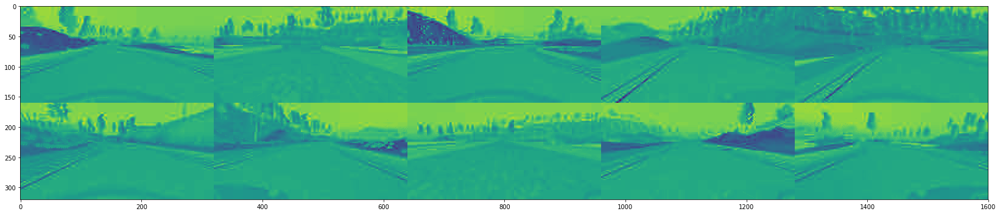

In [49]:
## YUV
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(YUV_views)
plt.tight_layout()
### Y
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(YUV_views[:,:,0])
plt.tight_layout()
### U
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(YUV_views[:,:,1])
plt.tight_layout()
### V
fig, ax = plt.subplots(figsize=(25,5))
ax.imshow(YUV_views[:,:,2])
plt.tight_layout()

# Visualize the filter

In [177]:
model.load_weights("model.h5")

D:\Anaconda_36\envs\car-behavioral-cloning\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [198]:
layer_dict = dict([(layer.name, layer) for layer in model.layers])

In [197]:
# this is the placeholder for the input images
input_img = model.input
input_img

<tf.Tensor 'lambda_input_1:0' shape=(?, 66, 200, 3) dtype=float32>

In [200]:
# get the symbolic outputs of each "key" layer (we gave them unique names).
layer_dict = dict([(layer.name, layer) for layer in model.layers[1:]])

In [301]:
layer_name = "convolution2d_5"

In [302]:
layer_output = layer_dict[layer_name].output

In [ ]:
def visualize_cat(cat):
    cat_batch = np.expand_dims(cat,axis=0)
    cat_batch.shape
    cat_conv = model.predict(cat_batch)
    cat_conv[0][:,:,20:23]
    cat_conv[0][:,:,:3].shape
#     catt__ = np.squeeze(c_batch, axis=0)
    plt.imshow(c_batch, cmap="gray")